In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, f1_score, precision_score, recall_score,
    ConfusionMatrixDisplay, roc_curve, precision_recall_curve
)
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings("ignore")



═════════════════════════════════════════════════════════════════
  CONCRETE CRACK DETECTION — LINE DETECTION ALGORITHM
═════════════════════════════════════════════════════════════════

[1/7]  Loading dataset and extracting features...
  📂  Walls / Cracked: 3751 images
  📂  Walls / Non-Cracked: 14188 images
  📂  Decks / Cracked: 1926 images
  📂  Decks / Non-Cracked: 11496 images

  Total images  : 31361
  Cracked       : 5677
  Non-Cracked   : 25684

[2/7]  Visualising line detection pipeline...


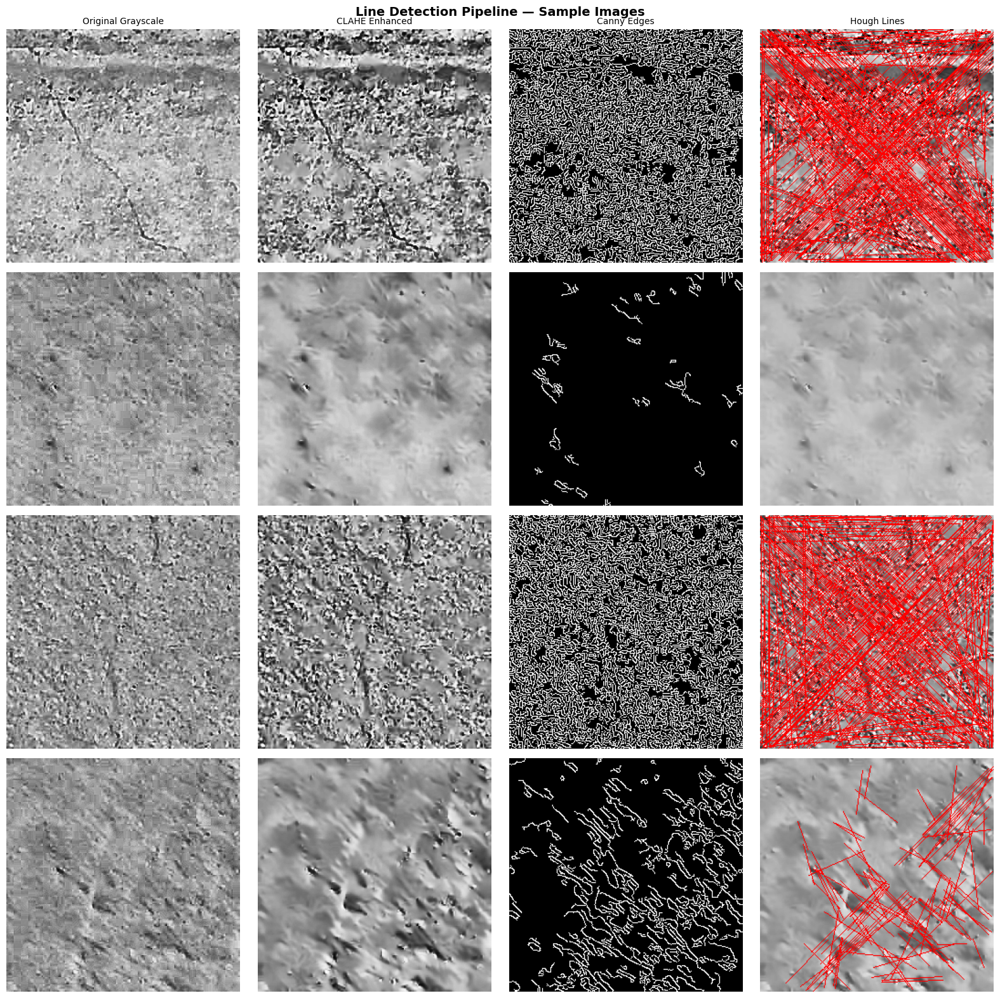

  ✔  Saved: pipeline_samples.png

[3/7]  Splitting dataset (70 / 30 stratified)...
  Train: 21952   Test: 9409

[4/7]  Training and evaluating models...

═════════════════════════════════════════════════════════════════
  MODEL EVALUATION
═════════════════════════════════════════════════════════════════

  ▶  Random Forest
     Accuracy  : 0.8192
     F1        : 0.7472
     Precision : 0.7659
     Recall    : 0.8192
     ROC-AUC   : 0.6806
     CV F1     : 0.7462 ± 0.0013

              precision    recall  f1-score   support

 Non-Cracked       0.82      0.99      0.90      7706
     Cracked       0.51      0.03      0.06      1703

    accuracy                           0.82      9409
   macro avg       0.67      0.51      0.48      9409
weighted avg       0.77      0.82      0.75      9409

─────────────────────────────────────────────────────────────────

  ▶  Gradient Boosting
     Accuracy  : 0.8202
     F1        : 0.7453
     Precision : 0.7793
     Recall    : 0.8202
     ROC

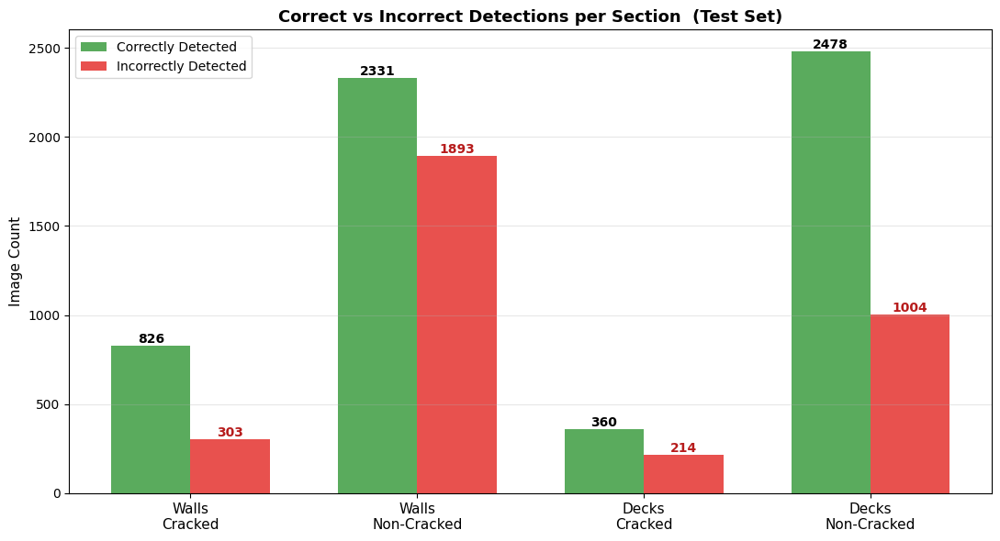

  ✔  Saved: section_accuracy_counts.png


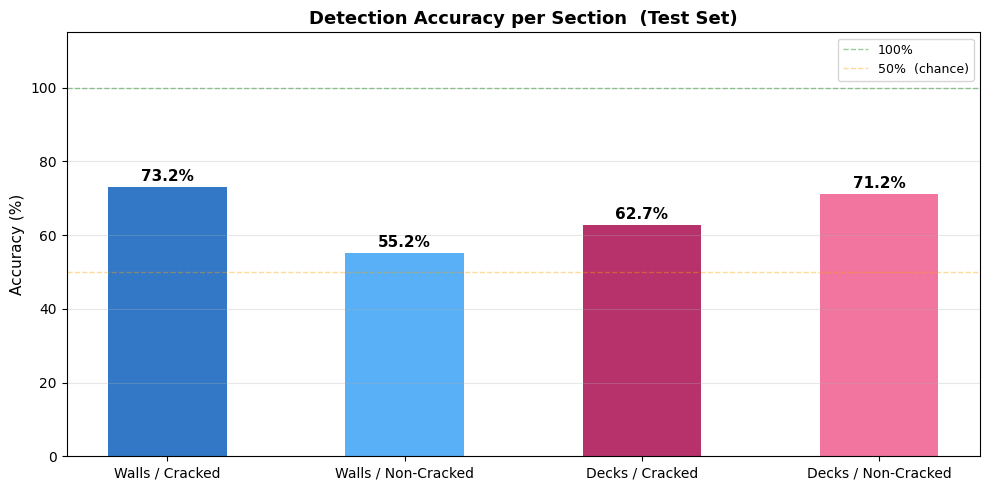

  ✔  Saved: section_accuracy_pct.png

[7/7]  Evaluation dashboard and image grids...


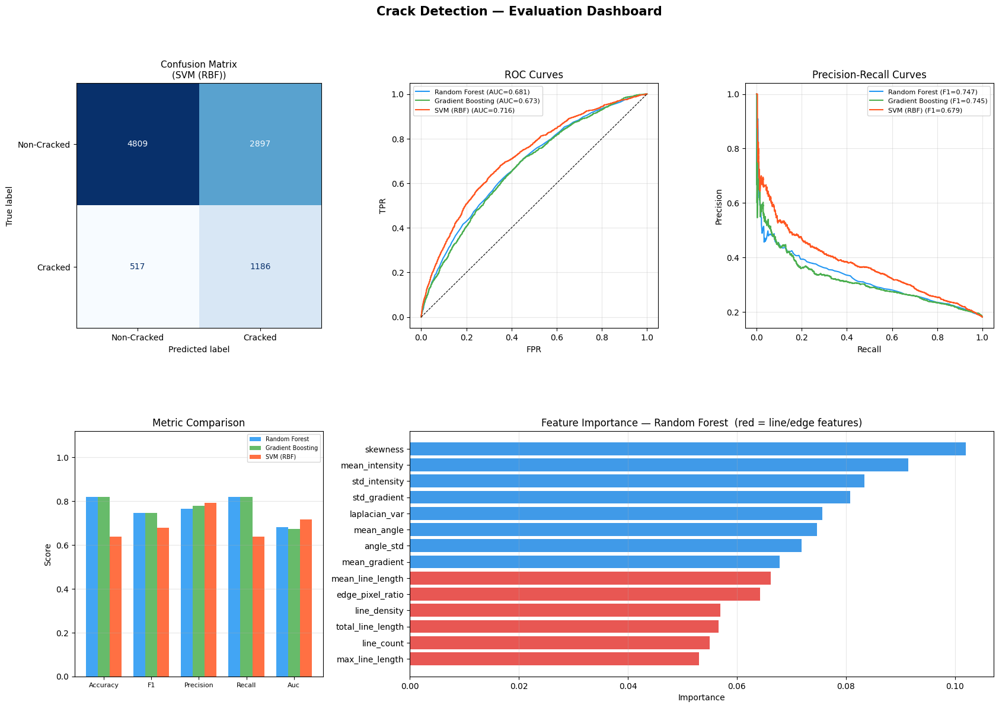

  ✔  Saved: evaluation_dashboard.png


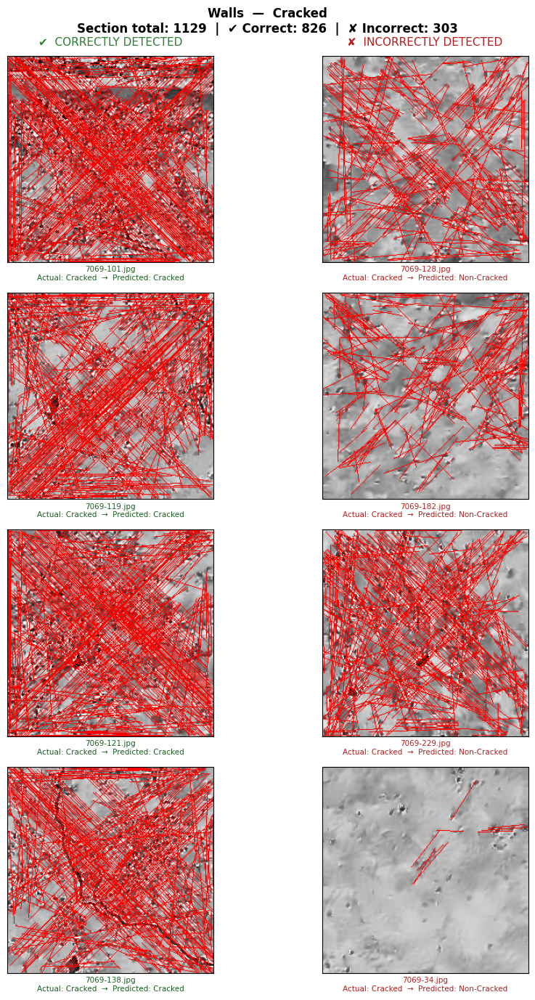

  ✔  Saved: grid_Walls_Cracked.png


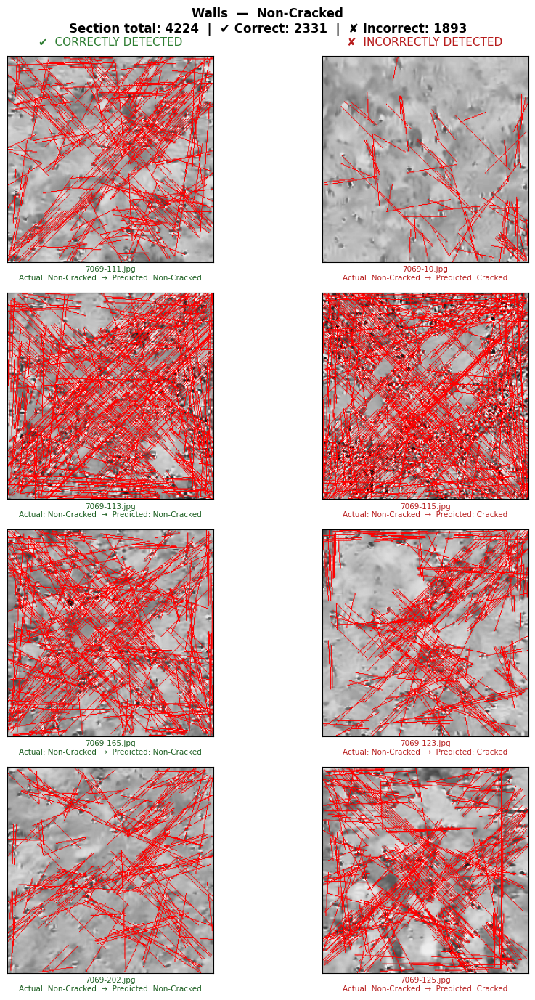

  ✔  Saved: grid_Walls_Non_Cracked.png


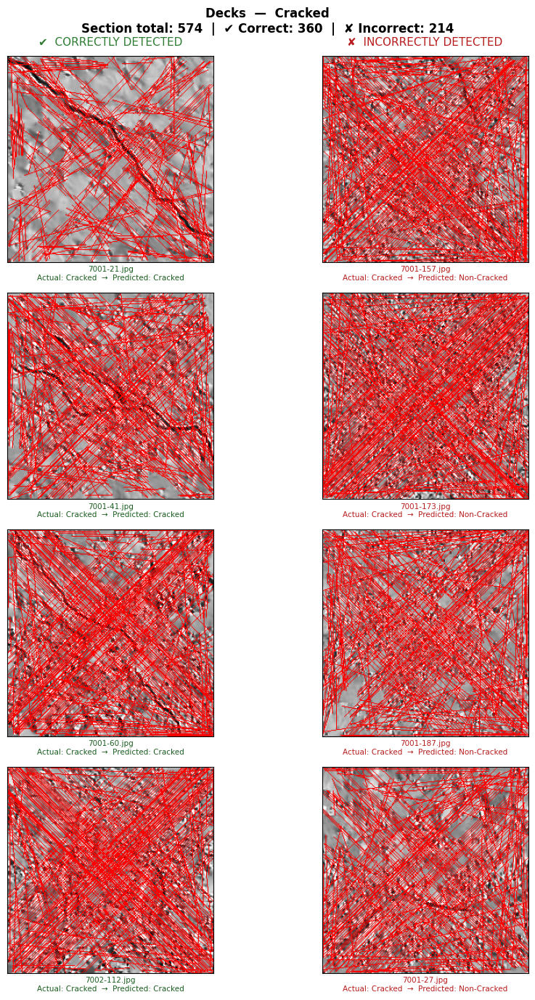

  ✔  Saved: grid_Decks_Cracked.png


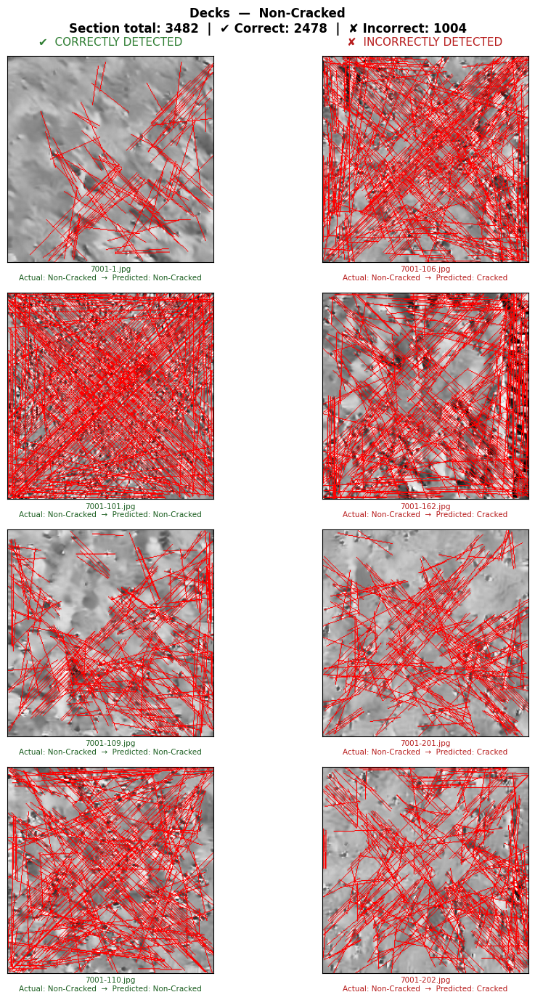

  ✔  Saved: grid_Decks_Non_Cracked.png

  ✔  Best model saved: crack_detector_model.pkl

  ✅  Done! All outputs saved.



In [3]:
"""
Crack Detection Algorithm — Line Detection on Grayscale Images
==============================================================
Per-image reporting: for every section (Walls/Cracked, Walls/Non-Cracked,
Decks/Cracked, Decks/Non-Cracked) the code prints each image filename,
whether the prediction was CORRECT or INCORRECT, and a full section summary.

Dataset Structure:
  Training_Pool_A_Walls/
      Cracked/
      Non-Cracked/
  Training_Pool_B_Decks/
      Cracked/
      Non-Cracked/
"""

import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import (
    accuracy_score, classification_report, confusion_matrix,
    roc_auc_score, f1_score, precision_score, recall_score,
    ConfusionMatrixDisplay, roc_curve, precision_recall_curve,
)
from sklearn.pipeline import Pipeline
import warnings, joblib
warnings.filterwarnings("ignore")


# ─────────────────────────────────────────────────────────────────────────────
# CONFIG
# ─────────────────────────────────────────────────────────────────────────────
BASE_PATH = r"C:\Users\Kritvi Gera\Desktop\ICL\Data Project\2. Image processing\Project_Vision_Data_Group_A\Project_Vision_Data_Group_A_Processed"

POOLS = {
    "Walls": os.path.join(BASE_PATH, "Training_Pool_A_Walls"),
    "Decks": os.path.join(BASE_PATH, "Training_Pool_B_Decks"),
}

LABEL_MAP     = {"Cracked": 1, "Non-Cracked": 0}   # folder name → label
LABEL_NAMES   = {1: "Cracked", 0: "Non-Cracked"}   # label → display name

IMAGE_SIZE    = (256, 256)
SUPPORTED_EXT = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

CANNY_LOW       = 50
CANNY_HIGH      = 150
HOUGH_THRESHOLD = 50
HOUGH_MIN_LINE  = 30
HOUGH_MAX_GAP   = 10


# ─────────────────────────────────────────────────────────────────────────────
# STEP 1 — PREPROCESSING
# ─────────────────────────────────────────────────────────────────────────────
def preprocess(img_path: str) -> np.ndarray:
    """Load → grayscale → denoise → CLAHE → resize."""
    img = cv2.imread(str(img_path))
    if img is None:
        raise FileNotFoundError(f"Cannot read: {img_path}")
    gray     = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    denoised = cv2.fastNlMeansDenoising(gray, h=10)
    clahe    = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(denoised)
    return cv2.resize(enhanced, IMAGE_SIZE)


# ─────────────────────────────────────────────────────────────────────────────
# STEP 2 — FEATURE EXTRACTION (line + edge + intensity)
# ─────────────────────────────────────────────────────────────────────────────
def extract_features(gray: np.ndarray) -> dict:
    h, w         = gray.shape
    total_pixels = h * w

    edges            = cv2.Canny(gray, CANNY_LOW, CANNY_HIGH)
    edge_pixel_ratio = np.sum(edges > 0) / total_pixels

    lines = cv2.HoughLinesP(
        edges, rho=1, theta=np.pi / 180,
        threshold=HOUGH_THRESHOLD,
        minLineLength=HOUGH_MIN_LINE,
        maxLineGap=HOUGH_MAX_GAP,
    )

    if lines is not None:
        lengths, angles = [], []
        for x1, y1, x2, y2 in lines[:, 0]:
            lengths.append(np.sqrt((x2 - x1) ** 2 + (y2 - y1) ** 2))
            angles.append(np.degrees(np.arctan2(y2 - y1, x2 - x1)))
        lengths      = np.array(lengths)
        angles       = np.array(angles)
        line_count   = len(lengths)
        total_ll     = lengths.sum()
        mean_ll      = lengths.mean()
        max_ll       = lengths.max()
        line_density = total_ll / total_pixels
        angle_std    = angles.std()
        mean_angle   = np.abs(angles).mean()
    else:
        line_count = total_ll = mean_ll = max_ll = line_density = angle_std = mean_angle = 0

    sobelx   = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely   = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    grad_mag = np.sqrt(sobelx ** 2 + sobely ** 2)

    flat     = gray.flatten().astype(np.float64)
    mean_int = flat.mean()
    std_int  = flat.std()

    return {
        "line_count":        line_count,
        "total_line_length": total_ll,
        "mean_line_length":  mean_ll,
        "max_line_length":   max_ll,
        "line_density":      line_density,
        "angle_std":         angle_std,
        "mean_angle":        mean_angle,
        "edge_pixel_ratio":  edge_pixel_ratio,
        "mean_gradient":     grad_mag.mean(),
        "std_gradient":      grad_mag.std(),
        "laplacian_var":     cv2.Laplacian(gray, cv2.CV_64F).var(),
        "mean_intensity":    mean_int,
        "std_intensity":     std_int,
        "skewness":          float(np.mean(((flat - mean_int) / (std_int + 1e-6)) ** 3)),
    }

FEATURE_NAMES = list(extract_features(np.zeros(IMAGE_SIZE, dtype=np.uint8)).keys())


# ─────────────────────────────────────────────────────────────────────────────
# STEP 3 — LOAD DATASET  (preserves full per-image metadata)
# ─────────────────────────────────────────────────────────────────────────────
def load_dataset(pools: dict):
    """
    Returns:
      X        — feature matrix  (N, 14)
      y        — labels          (N,)
      records  — list of dicts:
                   path / filename / pool / section / label / pred / correct
    """
    X, y, records = [], [], []

    for pool_name, pool_path in pools.items():
        for label_name, label_val in LABEL_MAP.items():
            folder = os.path.join(pool_path, label_name)
            if not os.path.isdir(folder):
                print(f"  ⚠  Folder not found: {folder}")
                continue

            files = sorted([
                f for f in Path(folder).iterdir()
                if f.suffix.lower() in SUPPORTED_EXT
            ])
            print(f"  📂  {pool_name} / {label_name}: {len(files)} images")

            for fp in files:
                try:
                    gray  = preprocess(str(fp))
                    feats = extract_features(gray)
                    X.append(list(feats.values()))
                    y.append(label_val)
                    records.append({
                        "path":     str(fp),
                        "filename": fp.name,
                        "pool":     pool_name,
                        "section":  label_name,   # "Cracked" | "Non-Cracked"
                        "label":    label_val,
                        "pred":     None,          # filled after model training
                        "correct":  None,
                    })
                except Exception as e:
                    print(f"    ✗  {fp.name}: {e}")

    return np.array(X), np.array(y), records


# ─────────────────────────────────────────────────────────────────────────────
# STEP 4 — TRAIN & EVALUATE THREE MODELS
# ─────────────────────────────────────────────────────────────────────────────
def build_models():
    return {
        "Random Forest": Pipeline([
            ("scaler", StandardScaler()),
            ("clf",    RandomForestClassifier(
                n_estimators=200, class_weight="balanced",
                random_state=42, n_jobs=-1)),
        ]),
        "Gradient Boosting": Pipeline([
            ("scaler", StandardScaler()),
            ("clf",    GradientBoostingClassifier(
                n_estimators=150, learning_rate=0.05,
                max_depth=4, random_state=42)),
        ]),
        "SVM (RBF)": Pipeline([
            ("scaler", StandardScaler()),
            ("clf",    SVC(kernel="rbf", C=10, gamma="scale",
                          class_weight="balanced", probability=True, random_state=42)),
        ]),
    }


def evaluate_models(X_train, X_test, y_train, y_test):
    models  = build_models()
    results = {}

    print("\n" + "═" * 65)
    print("  MODEL EVALUATION")
    print("═" * 65)

    for name, model in models.items():
        model.fit(X_train, y_train)
        y_pred  = model.predict(X_test)
        y_proba = model.predict_proba(X_test)[:, 1]
        cv_f1   = cross_val_score(model, X_train, y_train,
                                  cv=5, scoring="f1_weighted", n_jobs=-1)

        results[name] = {
            "model":     model,
            "y_pred":    y_pred,
            "y_proba":   y_proba,
            "accuracy":  accuracy_score(y_test, y_pred),
            "f1":        f1_score(y_test, y_pred, average="weighted"),
            "precision": precision_score(y_test, y_pred, average="weighted", zero_division=0),
            "recall":    recall_score(y_test, y_pred, average="weighted"),
            "auc":       roc_auc_score(y_test, y_proba),
            "cv_mean":   cv_f1.mean(),
            "cv_std":    cv_f1.std(),
        }

        r = results[name]
        print(f"\n  ▶  {name}")
        print(f"     Accuracy  : {r['accuracy']:.4f}")
        print(f"     F1        : {r['f1']:.4f}")
        print(f"     Precision : {r['precision']:.4f}")
        print(f"     Recall    : {r['recall']:.4f}")
        print(f"     ROC-AUC   : {r['auc']:.4f}")
        print(f"     CV F1     : {r['cv_mean']:.4f} ± {r['cv_std']:.4f}")
        print()
        print(classification_report(y_test, y_pred,
                                    target_names=["Non-Cracked", "Cracked"]))
        print("─" * 65)

    best_name = max(results, key=lambda k: results[k]["auc"])
    print(f"\n  🏆  Best model: {best_name}  (AUC = {results[best_name]['auc']:.4f})")
    return results, best_name


# ─────────────────────────────────────────────────────────────────────────────
# STEP 5 — ATTACH PREDICTIONS BACK TO EVERY RECORD
# ─────────────────────────────────────────────────────────────────────────────
def attach_predictions(records, test_indices, y_pred_test):
    """Map best-model predictions onto original record list via test indices."""
    for idx, pred in zip(test_indices, y_pred_test):
        records[idx]["pred"]    = int(pred)
        records[idx]["correct"] = (int(pred) == records[idx]["label"])


# ─────────────────────────────────────────────────────────────────────────────
# STEP 6 — PER-SECTION DETAILED CONSOLE REPORT
# ─────────────────────────────────────────────────────────────────────────────
def print_per_section_report(records):
    """
    For each Pool × Section, list every test-set image with
    ✔ CORRECT or ✘ INCORRECT, then print a section summary.
    """
    sections = [
        ("Walls", "Cracked"),
        ("Walls", "Non-Cracked"),
        ("Decks", "Cracked"),
        ("Decks", "Non-Cracked"),
    ]

    print("\n" + "═" * 75)
    print("  PER-IMAGE DETECTION RESULTS  (test set only — best model)")
    print("═" * 75)

    grand_total = grand_correct = 0

    for pool, section in sections:
        subset = [r for r in records
                  if r["pool"] == pool
                  and r["section"] == section
                  and r["pred"] is not None]
        if not subset:
            continue

        n_correct   = sum(r["correct"] for r in subset)
        n_incorrect = len(subset) - n_correct
        pct         = 100 * n_correct / len(subset)
        class_note  = "Positive class" if section == "Cracked" else "Negative class"

        print(f"\n  ┌─ {pool.upper()}  —  {section.upper()}  ({class_note})")
        print(f"  │  Images in test set : {len(subset)}")
        print(f"  │  Correctly detected : {n_correct}  ({pct:.1f}%)")
        print(f"  │  Missed / Wrong     : {n_incorrect}  ({100 - pct:.1f}%)")
        print(f"  │")
        print(f"  │  {'#':<5} {'FILENAME':<42} {'ACTUAL':<14} {'PREDICTED':<14} STATUS")
        print(f"  │  {'─'*5} {'─'*42} {'─'*14} {'─'*14} {'─'*14}")

        for i, r in enumerate(subset, 1):
            actual_lbl = LABEL_NAMES[r["label"]]
            pred_lbl   = LABEL_NAMES[r["pred"]]
            status     = "✔  CORRECT" if r["correct"] else "✘  INCORRECT"
            print(f"  │  {i:<5} {r['filename']:<42} {actual_lbl:<14} {pred_lbl:<14} {status}")

        print(f"  └{'─'*74}")

        grand_total   += len(subset)
        grand_correct += n_correct

    # Grand totals
    print("\n" + "═" * 75)
    print("  GRAND SUMMARY  (test set — all sections combined)")
    print(f"  Total images evaluated  : {grand_total}")
    print(f"  Correctly detected      : {grand_correct}  "
          f"({100 * grand_correct / grand_total:.2f}%)")
    print(f"  Incorrectly detected    : {grand_total - grand_correct}  "
          f"({100 * (grand_total - grand_correct) / grand_total:.2f}%)")
    print("═" * 75)


# ─────────────────────────────────────────────────────────────────────────────
# STEP 7 — SECTION ACCURACY BAR CHART (counts)
# ─────────────────────────────────────────────────────────────────────────────
def plot_section_accuracy(records):
    sections = [
        ("Walls", "Cracked"),
        ("Walls", "Non-Cracked"),
        ("Decks", "Cracked"),
        ("Decks", "Non-Cracked"),
    ]
    labels, correct_counts, incorrect_counts = [], [], []

    for pool, section in sections:
        subset = [r for r in records
                  if r["pool"] == pool and r["section"] == section
                  and r["pred"] is not None]
        if not subset:
            continue
        nc = sum(r["correct"] for r in subset)
        labels.append(f"{pool}\n{section}")
        correct_counts.append(nc)
        incorrect_counts.append(len(subset) - nc)

    x     = np.arange(len(labels))
    width = 0.35

    fig, ax = plt.subplots(figsize=(11, 6))
    bars_c = ax.bar(x - width / 2, correct_counts,   width,
                    label="Correctly Detected",   color="#43A047", alpha=0.88)
    bars_i = ax.bar(x + width / 2, incorrect_counts, width,
                    label="Incorrectly Detected", color="#E53935", alpha=0.88)

    for bar in bars_c:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, h + 0.3,
                str(int(h)), ha="center", va="bottom", fontsize=10, fontweight="bold")
    for bar in bars_i:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, h + 0.3,
                str(int(h)), ha="center", va="bottom", fontsize=10,
                fontweight="bold", color="#B71C1C")

    ax.set_xticks(x)
    ax.set_xticklabels(labels, fontsize=11)
    ax.set_ylabel("Image Count", fontsize=11)
    ax.set_title("Correct vs Incorrect Detections per Section  (Test Set)",
                 fontsize=13, fontweight="bold")
    ax.legend(fontsize=10)
    ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.savefig("section_accuracy_counts.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("  ✔  Saved: section_accuracy_counts.png")


# ─────────────────────────────────────────────────────────────────────────────
# STEP 8 — SECTION ACCURACY % BAR CHART
# ─────────────────────────────────────────────────────────────────────────────
def plot_section_accuracy_pct(records):
    sections = [
        ("Walls", "Cracked"),
        ("Walls", "Non-Cracked"),
        ("Decks", "Cracked"),
        ("Decks", "Non-Cracked"),
    ]
    color_map = {
        ("Walls", "Cracked"):     "#1565C0",
        ("Walls", "Non-Cracked"): "#42A5F5",
        ("Decks", "Cracked"):     "#AD1457",
        ("Decks", "Non-Cracked"): "#F06292",
    }
    labels, pcts, bar_colors = [], [], []

    for key in sections:
        pool, section = key
        subset = [r for r in records
                  if r["pool"] == pool and r["section"] == section
                  and r["pred"] is not None]
        if not subset:
            continue
        pct = 100 * sum(r["correct"] for r in subset) / len(subset)
        labels.append(f"{pool} / {section}")
        pcts.append(pct)
        bar_colors.append(color_map[key])

    fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.bar(labels, pcts, color=bar_colors, alpha=0.88, width=0.5)
    ax.axhline(y=100, color="green",  lw=1, ls="--", alpha=0.4, label="100%")
    ax.axhline(y=50,  color="orange", lw=1, ls="--", alpha=0.4, label="50%  (chance)")

    for bar, pct in zip(bars, pcts):
        ax.text(bar.get_x() + bar.get_width() / 2, pct + 0.8,
                f"{pct:.1f}%", ha="center", va="bottom", fontsize=11, fontweight="bold")

    ax.set_ylim(0, 115)
    ax.set_ylabel("Accuracy (%)", fontsize=11)
    ax.set_title("Detection Accuracy per Section  (Test Set)",
                 fontsize=13, fontweight="bold")
    ax.legend(fontsize=9)
    ax.grid(axis="y", alpha=0.3)
    plt.tight_layout()
    plt.savefig("section_accuracy_pct.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("  ✔  Saved: section_accuracy_pct.png")


# ─────────────────────────────────────────────────────────────────────────────
# STEP 9 — FULL EVALUATION DASHBOARD
# ─────────────────────────────────────────────────────────────────────────────
def plot_evaluation_dashboard(results, best_name, y_test):
    fig = plt.figure(figsize=(20, 13))
    fig.suptitle("Crack Detection — Evaluation Dashboard", fontsize=15, fontweight="bold")
    gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.42, wspace=0.35)

    # 1. Confusion matrix
    ax1  = fig.add_subplot(gs[0, 0])
    cm   = confusion_matrix(y_test, results[best_name]["y_pred"])
    disp = ConfusionMatrixDisplay(cm, display_labels=["Non-Cracked", "Cracked"])
    disp.plot(ax=ax1, colorbar=False, cmap="Blues")
    ax1.set_title(f"Confusion Matrix\n({best_name})", fontsize=11)

    # 2. ROC curves
    ax2    = fig.add_subplot(gs[0, 1])
    colors = ["#2196F3", "#4CAF50", "#FF5722"]
    for (name, res), col in zip(results.items(), colors):
        fpr, tpr, _ = roc_curve(y_test, res["y_proba"])
        ax2.plot(fpr, tpr, label=f"{name} (AUC={res['auc']:.3f})", color=col)
    ax2.plot([0, 1], [0, 1], "k--", lw=0.8)
    ax2.set_xlabel("FPR"); ax2.set_ylabel("TPR")
    ax2.set_title("ROC Curves"); ax2.legend(fontsize=8); ax2.grid(alpha=0.3)

    # 3. PR curves
    ax3 = fig.add_subplot(gs[0, 2])
    for (name, res), col in zip(results.items(), colors):
        prec, rec, _ = precision_recall_curve(y_test, res["y_proba"])
        ax3.plot(rec, prec, label=f"{name} (F1={res['f1']:.3f})", color=col)
    ax3.set_xlabel("Recall"); ax3.set_ylabel("Precision")
    ax3.set_title("Precision-Recall Curves"); ax3.legend(fontsize=8); ax3.grid(alpha=0.3)

    # 4. Metric comparison bar chart
    ax4      = fig.add_subplot(gs[1, 0])
    met_keys = ["accuracy", "f1", "precision", "recall", "auc"]
    x        = np.arange(len(met_keys))
    bw       = 0.25
    for i, (name, col) in enumerate(zip(results.keys(), colors)):
        ax4.bar(x + i * bw, [results[name][m] for m in met_keys],
                bw, label=name, color=col, alpha=0.85)
    ax4.set_xticks(x + bw)
    ax4.set_xticklabels([m.capitalize() for m in met_keys], fontsize=8)
    ax4.set_ylim(0, 1.12); ax4.set_ylabel("Score")
    ax4.set_title("Metric Comparison"); ax4.legend(fontsize=7); ax4.grid(axis="y", alpha=0.3)

    # 5. Feature importance
    ax5 = fig.add_subplot(gs[1, 1:])
    rf  = results.get("Random Forest", {}).get("model")
    if rf:
        imps       = rf.named_steps["clf"].feature_importances_
        sorted_idx = np.argsort(imps)
        bar_colors = [
            "#E53935" if any(k in FEATURE_NAMES[i] for k in ["line", "edge"])
            else "#1E88E5"
            for i in sorted_idx
        ]
        ax5.barh(np.array(FEATURE_NAMES)[sorted_idx], imps[sorted_idx],
                 color=bar_colors, alpha=0.85)
        ax5.set_xlabel("Importance")
        ax5.set_title("Feature Importance — Random Forest  (red = line/edge features)")
        ax5.grid(axis="x", alpha=0.3)

    plt.savefig("evaluation_dashboard.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("  ✔  Saved: evaluation_dashboard.png")


# ─────────────────────────────────────────────────────────────────────────────
# STEP 10 — PIPELINE SAMPLE VISUALISATION
# ─────────────────────────────────────────────────────────────────────────────
def plot_pipeline_samples(pools: dict, n_samples: int = 4):
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, n_samples * 4))
    fig.suptitle("Line Detection Pipeline — Sample Images", fontsize=14, fontweight="bold")
    for ax, t in zip(axes[0], ["Original Grayscale", "CLAHE Enhanced",
                                "Canny Edges", "Hough Lines"]):
        ax.set_title(t, fontsize=10)

    samples = []
    for pool_path in pools.values():
        for label in LABEL_MAP:
            folder = os.path.join(pool_path, label)
            if os.path.isdir(folder):
                files = [f for f in Path(folder).iterdir()
                         if f.suffix.lower() in SUPPORTED_EXT]
                if files:
                    samples.append((str(files[0]), label))
            if len(samples) >= n_samples:
                break
        if len(samples) >= n_samples:
            break

    for row, (img_path, label) in enumerate(samples[:n_samples]):
        raw   = cv2.resize(cv2.imread(img_path, cv2.IMREAD_GRAYSCALE), IMAGE_SIZE)
        proc  = preprocess(img_path)
        edges = cv2.Canny(proc, CANNY_LOW, CANNY_HIGH)
        lines = cv2.HoughLinesP(edges, 1, np.pi / 180, HOUGH_THRESHOLD,
                                 minLineLength=HOUGH_MIN_LINE, maxLineGap=HOUGH_MAX_GAP)
        overlay = cv2.cvtColor(proc, cv2.COLOR_GRAY2BGR)
        if lines is not None:
            for x1, y1, x2, y2 in lines[:, 0]:
                cv2.line(overlay, (x1, y1), (x2, y2), (0, 0, 255), 1)

        for col, img_data in enumerate(
            [raw, proc, edges, cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)]
        ):
            axes[row, col].imshow(img_data, cmap="gray" if col < 3 else None)
            axes[row, col].axis("off")
        axes[row, 0].set_ylabel(label, rotation=90, fontsize=9, labelpad=5)

    plt.tight_layout()
    plt.savefig("pipeline_samples.png", dpi=150, bbox_inches="tight")
    plt.show()
    print("  ✔  Saved: pipeline_samples.png")


# ─────────────────────────────────────────────────────────────────────────────
# STEP 11 — IMAGE GRID: CORRECT & INCORRECT PER SECTION
# ─────────────────────────────────────────────────────────────────────────────
def make_hough_overlay(img_path: str) -> np.ndarray:
    """Return RGB image with Hough line segments drawn in red."""
    proc    = preprocess(img_path)
    edges   = cv2.Canny(proc, CANNY_LOW, CANNY_HIGH)
    lines   = cv2.HoughLinesP(edges, 1, np.pi / 180, HOUGH_THRESHOLD,
                               minLineLength=HOUGH_MIN_LINE, maxLineGap=HOUGH_MAX_GAP)
    overlay = cv2.cvtColor(proc, cv2.COLOR_GRAY2BGR)
    if lines is not None:
        for x1, y1, x2, y2 in lines[:, 0]:
            cv2.line(overlay, (x1, y1), (x2, y2), (0, 0, 255), 1)
    return cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)


def plot_correct_incorrect_grid(records, n_each: int = 4):
    """
    For each section show up to n_each correct AND n_each incorrect images
    side-by-side with Hough line overlays and captions.
    """
    sections = [
        ("Walls", "Cracked"),
        ("Walls", "Non-Cracked"),
        ("Decks", "Cracked"),
        ("Decks", "Non-Cracked"),
    ]

    for pool, section in sections:
        subset = [r for r in records
                  if r["pool"] == pool and r["section"] == section
                  and r["pred"] is not None]
        if not subset:
            continue

        correct_recs   = [r for r in subset if r["correct"]][:n_each]
        incorrect_recs = [r for r in subset if not r["correct"]][:n_each]
        n_rows         = max(len(correct_recs), len(incorrect_recs))
        if n_rows == 0:
            continue

        fig, axes = plt.subplots(n_rows, 2, figsize=(10, n_rows * 3.5))
        if n_rows == 1:
            axes = np.expand_dims(axes, 0)

        total_correct   = sum(1 for r in subset if r["correct"])
        total_incorrect = len(subset) - total_correct
        fig.suptitle(
            f"{pool}  —  {section}\n"
            f"Section total: {len(subset)}  |  "
            f"✔ Correct: {total_correct}  |  "
            f"✘ Incorrect: {total_incorrect}",
            fontsize=12, fontweight="bold"
        )

        axes[0, 0].set_title("✔  CORRECTLY DETECTED",   color="#2E7D32", fontsize=11, pad=10)
        axes[0, 1].set_title("✘  INCORRECTLY DETECTED", color="#B71C1C", fontsize=11, pad=10)

        for row in range(n_rows):
            for col, recs in enumerate([correct_recs, incorrect_recs]):
                ax = axes[row, col]
                if row < len(recs):
                    r       = recs[row]
                    overlay = make_hough_overlay(r["path"])
                    ax.imshow(overlay)
                    caption = (
                        f"{r['filename']}\n"
                        f"Actual: {LABEL_NAMES[r['label']]}"
                        f"  →  Predicted: {LABEL_NAMES[r['pred']]}"
                    )
                    ax.set_xlabel(caption, fontsize=7.5,
                                  color="#1B5E20" if r["correct"] else "#B71C1C")
                else:
                    ax.set_visible(False)
                ax.set_xticks([]); ax.set_yticks([])

        plt.tight_layout()
        safe = f"grid_{pool}_{section.replace(' ', '_').replace('-', '_')}.png"
        plt.savefig(safe, dpi=130, bbox_inches="tight")
        plt.show()
        print(f"  ✔  Saved: {safe}")


# ─────────────────────────────────────────────────────────────────────────────
# MAIN
# ─────────────────────────────────────────────────────────────────────────────
if __name__ == "__main__":
    print("\n" + "═" * 65)
    print("  CONCRETE CRACK DETECTION — LINE DETECTION ALGORITHM")
    print("═" * 65)

    # 1. Load all images and extract features
    print("\n[1/7]  Loading dataset and extracting features...")
    X, y, records = load_dataset(POOLS)
    print(f"\n  Total images  : {len(y)}")
    print(f"  Cracked       : {np.sum(y == 1)}")
    print(f"  Non-Cracked   : {np.sum(y == 0)}")

    # 2. Pipeline visualisation
    print("\n[2/7]  Visualising line detection pipeline...")
    plot_pipeline_samples(POOLS, n_samples=4)

    # 3. Stratified split — keep track of indices so we can map preds back
    print("\n[3/7]  Splitting dataset (70 / 30 stratified)...")
    indices              = np.arange(len(y))
    train_idx, test_idx  = train_test_split(
        indices, test_size=0.30, stratify=y, random_state=42
    )
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]
    print(f"  Train: {len(y_train)}   Test: {len(y_test)}")

    # 4. Train and evaluate all three models
    print("\n[4/7]  Training and evaluating models...")
    results, best_name = evaluate_models(X_train, X_test, y_train, y_test)

    # 5. Map best-model predictions back onto the record list
    attach_predictions(records, test_idx, results[best_name]["y_pred"])

    # 6. Print per-section console report
    print("\n[5/7]  Per-section detection report (printed to console)...")
    print_per_section_report(records)

    # 7. Section accuracy charts
    print("\n[6/7]  Plotting section accuracy charts...")
    plot_section_accuracy(records)
    plot_section_accuracy_pct(records)

    # 8. Full evaluation dashboard + image grids
    print("\n[7/7]  Evaluation dashboard and image grids...")
    plot_evaluation_dashboard(results, best_name, y_test)
    plot_correct_incorrect_grid(records, n_each=4)

    # Save best model
    joblib.dump(results[best_name]["model"], "crack_detector_model.pkl")
    print(f"\n  ✔  Best model saved: crack_detector_model.pkl")
    print("\n  ✅  Done! All outputs saved.\n")
